In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math
%matplotlib inline

In [ ]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1IfKxTknyO8M1rNHaSsKc8eFrWAw3R5yw' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1IfKxTknyO8M1rNHaSsKc8eFrWAw3R5yw" -O Elaine.bmp && rm -rf /tmp/cookies.txt

--2022-12-02 16:38:20--  https://docs.google.com/uc?export=download&confirm=&id=1IfKxTknyO8M1rNHaSsKc8eFrWAw3R5yw
Resolving docs.google.com (docs.google.com)... 173.194.216.102, 173.194.216.138, 173.194.216.113, ...
Connecting to docs.google.com (docs.google.com)|173.194.216.102|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-0g-8g-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/jqa8guvkmbuuap8ku2a85lsmr268ce96/1669999050000/04268100670184909597/*/1IfKxTknyO8M1rNHaSsKc8eFrWAw3R5yw?e=download&uuid=3155b3de-d50e-4c8e-beb0-4489fd47b8a8 [following]
--2022-12-02 16:38:20--  https://doc-0g-8g-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/jqa8guvkmbuuap8ku2a85lsmr268ce96/1669999050000/04268100670184909597/*/1IfKxTknyO8M1rNHaSsKc8eFrWAw3R5yw?e=download&uuid=3155b3de-d50e-4c8e-beb0-4489fd47b8a8
Resolving doc-0g-8g-docs.googleusercontent.com (doc-0g-8g-docs.googleusercontent.com)... 74.125.28.132

In [ ]:
img = cv2.imread('Elaine.bmp')
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

In [ ]:
laplacian_filter = np.array([[-1, -1, -1,], [-1, 9, -1], [-1, -1, -1]])
sharpenning_filter = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])

In [ ]:
def show_img(*args, figsize=10, is_gray=True, title=None, fontsize=12):
    if isinstance(figsize, int):
        figsize = (figsize, figsize)
    images = args[0] if type(args[0]) is list else list(args)
    cmap=None
    if not is_gray:
        images = list(map(lambda x: cv2.cvtColor(x, cv2.COLOR_BGR2RGB), images))
    else:
        cmap = 'gray'
    plt.figure(figsize=figsize)
    for i in range(1, len(images)+1):
        plt.subplot(1, len(images), i)
        if title is not None:
            plt.title(title[i-1], fontsize=fontsize)
        
        plt.imshow(images[i-1], cmap=cmap)
        plt.axis('off')

In [ ]:
from skimage.util import random_noise

def add_noise(img, mode, val=0.05):
    if (mode == 's&p'): 
        r = random_noise(img, mode, amount=val)
    elif (mode == 'gaussian'):
        r = random_noise(img, mode, var=val)
    
    return (r * 255).astype('uint8')

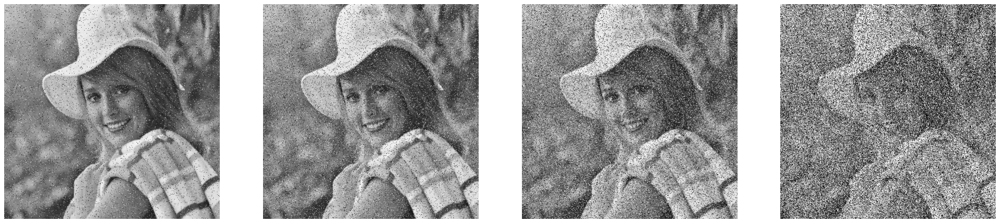

In [ ]:
spnoise = []
for i in [0.05, 0.1, 0.2, 0.5]:
    spnoise.append(add_noise(img, 's&p', val=i))
show_img(spnoise , figsize=30)

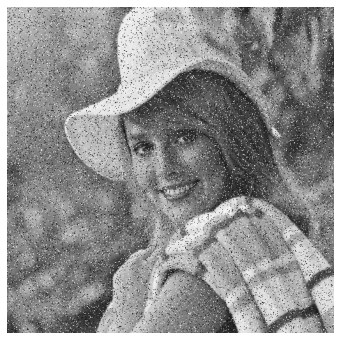

In [ ]:
out = add_noise(img, 's&p', val=0.1)
show_img(out, figsize=6)

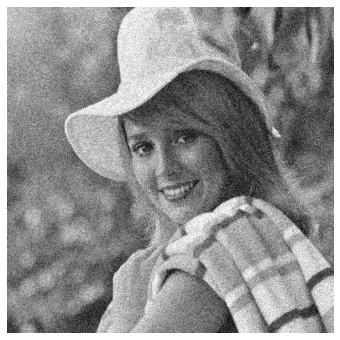

In [ ]:
out2 = add_noise(img, 'gaussian', val=0.01)
show_img(out2, figsize=6)

In [ ]:
# calculate mse
def mse_gray(img1, img2):
    diff = (img1 - img2) ** 2
    return np.sum(diff.ravel()) / (img1.shape[0] * img1.shape[1])

In [ ]:
def box(size):
    return np.ones((size, size)) * (1/(size*size))

In [ ]:
v = []
for i in [3, 5, 7, 9, 11]:
    c = cv2.filter2D(src=out2, ddepth=-1, kernel=box(i))
    v.append(mse_gray(c, img))

In [ ]:
v

[61.81682586669922,
 51.0272216796875,
 48.39679718017578,
 50.13457489013672,
 52.75083923339844]

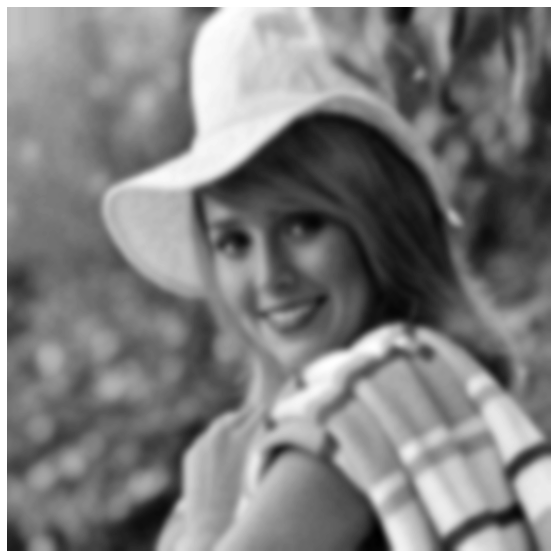

In [ ]:
a = np.array(img)
for i in range(15):
    a = cv2.filter2D(src=a, ddepth=-1, kernel=box(3))
show_img(a)

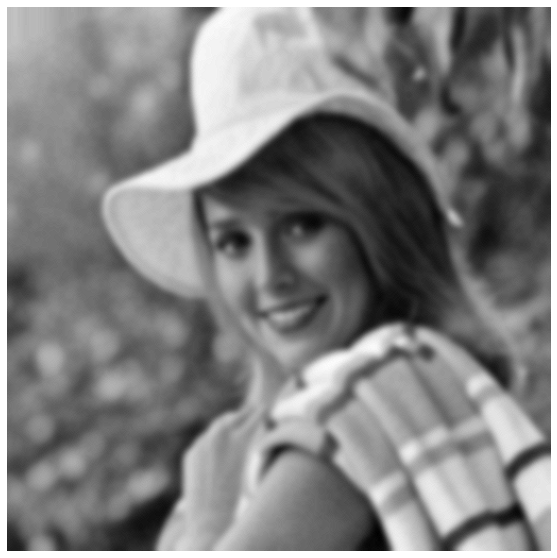

In [ ]:
# for i in range(2):
a = cv2.filter2D(src=a, ddepth=-1, kernel=sharpenning_filter)
show_img(a)

In [ ]:
def create_gaussian_filter(kernel_size, sigma=1):
    x, y = np.mgrid[-kernel_size//2 + 1:kernel_size//2 + 1, -kernel_size//2 + 1:kernel_size//2 + 1]
    g = np.exp(-((x**2 + y**2)/(2.0*sigma**2)))
    return g/g.sum()

def convolve_gaussian_filter(raveled_img, kernel):
    filter = kernel.ravel()
    return np.sum(filter * raveled_img)

In [ ]:
def filter(img, filter_size, mode='median', sigma=1):
    pad_size = int(math.floor(filter_size/2))
    x = np.pad(img, pad_size, 'mean')
    r = np.zeros((img.shape[0], img.shape[1]))
    
    is_g = False

    if (mode == 'median'):
        f = np.median
    elif (mode == 'box'):
        f = np.mean
    elif (mode == 'gaussian'):
        f = convolve_gaussian_filter
        is_g = True

    for i in range(pad_size, x.shape[0]-pad_size):
        for j in range(pad_size, x.shape[1]-pad_size):
            if is_g:
                g_filter = create_gaussian_filter(filter_size, sigma=sigma)
                r[i-pad_size, j-pad_size] = f(x[i-pad_size:i+pad_size+1, j-pad_size:j+pad_size+1].ravel(), g_filter)
            else:
                r[i-pad_size, j-pad_size] = f(x[i-pad_size:i+pad_size+1, j-pad_size:j+pad_size+1].ravel())
    
    
    return r.astype('uint8')

In [ ]:
filter_sizes = [3, 5, 7, 9, 11]
ro = [0.05, 0.1, 0.2, 0.5]
result = []
for p in ro:
    t = []
    noisy_img = add_noise(img, 's&p', val=p)
    for f in filter_sizes:
        t.append(filter(noisy_img, f))
    
    result.append(t)


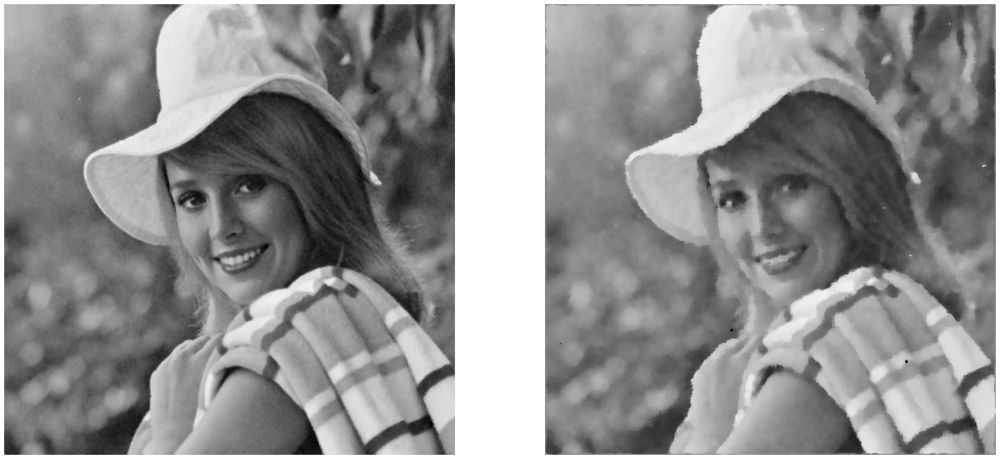

In [ ]:
show_img(result[0][0], result[3][2], figsize=30)

In [ ]:
for i in range(len(result)):
    for j in range(len(result[0])):
        print(f'%.2f\t' % mse_gray(result[i][j], img), end=' ')
    print()

28.13	 32.98	 35.20	 38.86	 41.81	 
29.21	 33.60	 35.56	 39.19	 42.00	 
31.87	 34.97	 36.69	 40.07	 42.86	 
46.37	 42.24	 41.55	 43.71	 45.89	 


In [ ]:
filter_sizes = [3, 5, 7, 9, 11]
sigma = [0.01, 0.05, 0.1]

median_result = []
box_result = []

for s in sigma:
    t = []
    u = []
    noisy_img = add_noise(img, 'gaussian', val=s)
    for f in filter_sizes:
        t.append(filter(noisy_img, f, mode='median'))
        u.append(filter(noisy_img, f, mode='box'))
    
    median_result.append(t)
    box_result.append(u)

In [ ]:
print('median filter result on image with gaussian noise')
for i in range(len(median_result)):
    for j in range(len(median_result[0])):
        print(f'%.2f\t' % mse_gray(median_result[i][j], img), end=' ')
    print()

print('\nbox filter result on image with gaussian noise')
for i in range(len(box_result)):
    for j in range(len(box_result[0])):
        print(f'%.2f\t' % mse_gray(box_result[i][j], img), end=' ')
    print()

median filter result on image with gaussian noise
69.07	 56.24	 51.17	 51.50	 53.47	 
92.78	 80.12	 71.58	 67.58	 65.70	 
99.78	 90.02	 81.92	 76.57	 73.32	 

box filter result on image with gaussian noise
61.90	 51.64	 49.32	 51.75	 54.72	 
86.04	 74.43	 69.00	 67.21	 67.36	 
93.78	 84.02	 78.92	 76.66	 76.13	 


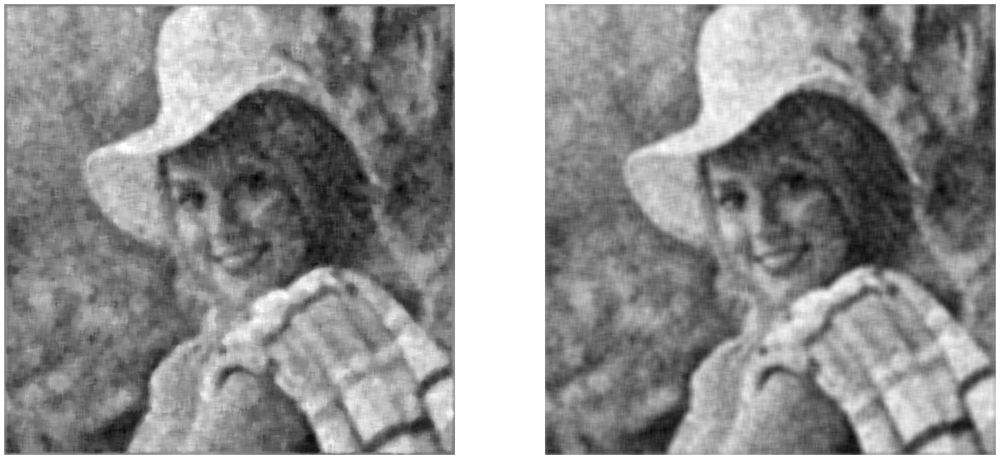

In [ ]:
show_img(median_result[2][3], box_result[2][3], figsize=30)

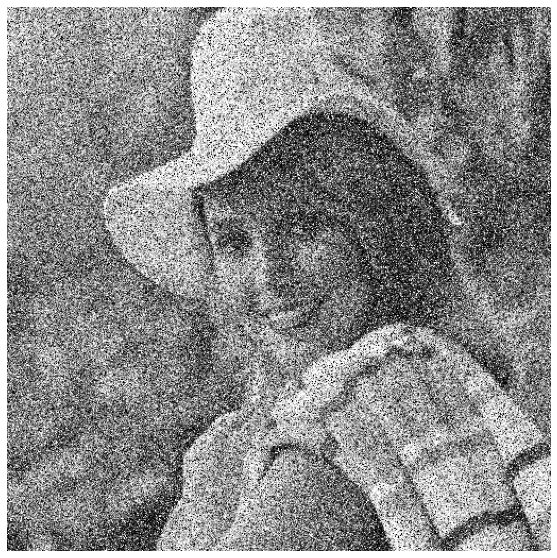

In [ ]:
noisy_img = add_noise(img, 's&p', 0.15)
noisy_img = add_noise(noisy_img, 'gaussian', 0.05)
show_img(noisy_img)

In [ ]:
a = filter(noisy_img, 7, 'median')
b = cv2.filter2D(src=a, ddepth=-1, kernel=create_gaussian_filter(7))

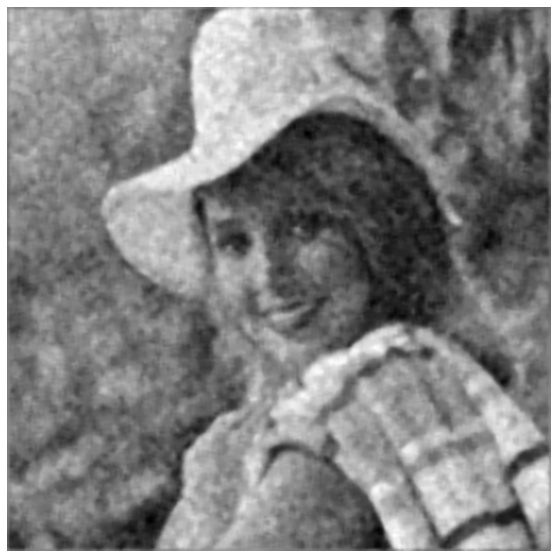

In [ ]:
show_img(b)

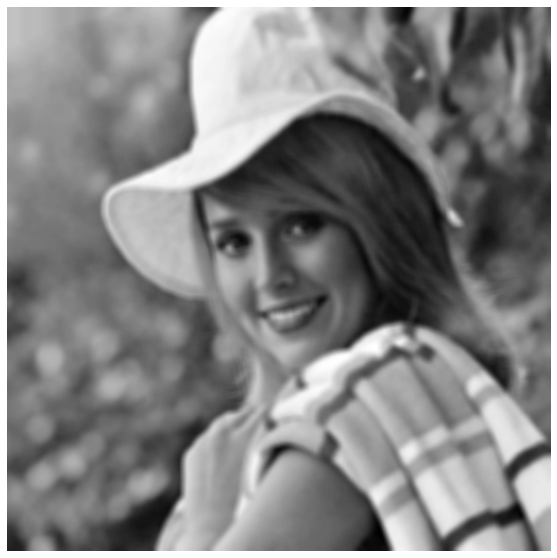

In [ ]:
blur = cv2.blur(img, ksize=(7,7))
show_img(blur)

۳.۳

In [ ]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1qYzX5mYXYkOfXBrDWdWRYLI0Q-G9xyYY' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1qYzX5mYXYkOfXBrDWdWRYLI0Q-G9xyYY" -O noise.jpeg && rm -rf /tmp/cookies.txt

--2022-12-02 16:43:25--  https://docs.google.com/uc?export=download&confirm=&id=1qYzX5mYXYkOfXBrDWdWRYLI0Q-G9xyYY
Resolving docs.google.com (docs.google.com)... 173.194.216.138, 173.194.216.113, 173.194.216.139, ...
Connecting to docs.google.com (docs.google.com)|173.194.216.138|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-00-8g-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/rpms0t6h0cuf745gsvcd30fqtih3sfis/1669999350000/04268100670184909597/*/1qYzX5mYXYkOfXBrDWdWRYLI0Q-G9xyYY?e=download&uuid=94597e47-5015-44e6-8212-44023e04e3c0 [following]
--2022-12-02 16:43:26--  https://doc-00-8g-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/rpms0t6h0cuf745gsvcd30fqtih3sfis/1669999350000/04268100670184909597/*/1qYzX5mYXYkOfXBrDWdWRYLI0Q-G9xyYY?e=download&uuid=94597e47-5015-44e6-8212-44023e04e3c0
Resolving doc-00-8g-docs.googleusercontent.com (doc-00-8g-docs.googleusercontent.com)... 74.125.28.132

In [ ]:
noisy_img = cv2.imread('noise.jpeg')
noisy_img = cv2.cvtColor(noisy_img, cv2.COLOR_BGR2GRAY)

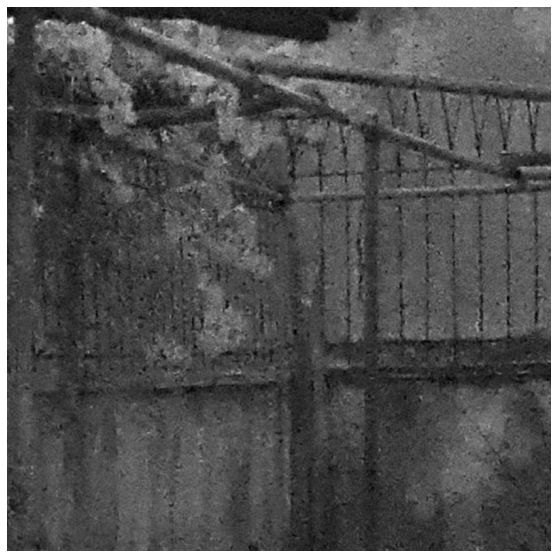

In [ ]:
show_img(noisy_img)

In [ ]:
a = filter(noisy_img, 7)

In [ ]:
b = cv2.filter2D(src=a, ddepth=-1, kernel=box(5))

In [ ]:
c = cv2.filter2D(src=b, ddepth=-1, kernel=laplacian_filter)

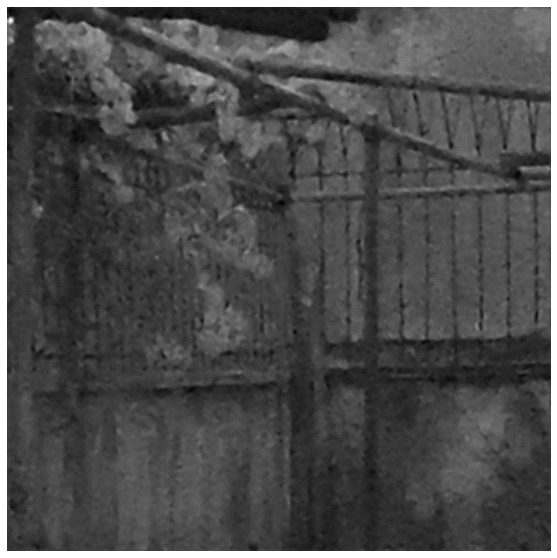

In [ ]:
show_img(c)

In [ ]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1f9bLIOuhYV2EJ6rHTnxOQwjkx6ZG15M9' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1f9bLIOuhYV2EJ6rHTnxOQwjkx6ZG15M9" -O blur.jpeg && rm -rf /tmp/cookies.txt


--2022-12-02 16:45:23--  https://docs.google.com/uc?export=download&confirm=&id=1f9bLIOuhYV2EJ6rHTnxOQwjkx6ZG15M9
Resolving docs.google.com (docs.google.com)... 173.194.216.113, 173.194.216.138, 173.194.216.139, ...
Connecting to docs.google.com (docs.google.com)|173.194.216.113|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-08-8g-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/b19fg1980lhttnoqgb851dmghlc67dsq/1669999500000/04268100670184909597/*/1f9bLIOuhYV2EJ6rHTnxOQwjkx6ZG15M9?e=download&uuid=1ea947c8-85ef-4c6e-a396-73fd81470bde [following]
--2022-12-02 16:45:24--  https://doc-08-8g-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/b19fg1980lhttnoqgb851dmghlc67dsq/1669999500000/04268100670184909597/*/1f9bLIOuhYV2EJ6rHTnxOQwjkx6ZG15M9?e=download&uuid=1ea947c8-85ef-4c6e-a396-73fd81470bde
Resolving doc-08-8g-docs.googleusercontent.com (doc-08-8g-docs.googleusercontent.com)... 74.125.28.132

In [ ]:
blur = cv2.imread('blur.jpeg')
blur = cv2.cvtColor(blur, cv2.COLOR_BGR2GRAY)

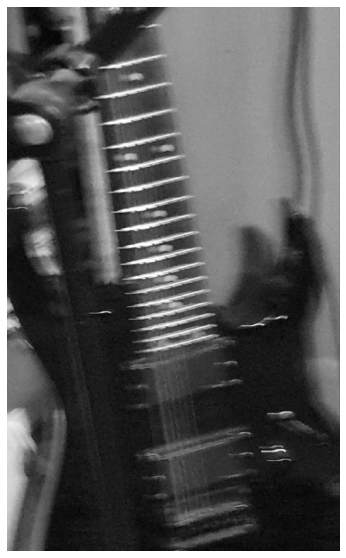

In [ ]:
show_img(blur)

In [ ]:
a = filter(blur, 7)

In [ ]:
b = cv2.filter2D(src=blur, ddepth=-1, kernel=box(3))

In [ ]:
c = cv2.filter2D(src=b, ddepth=-1, kernel=laplacian_filter)

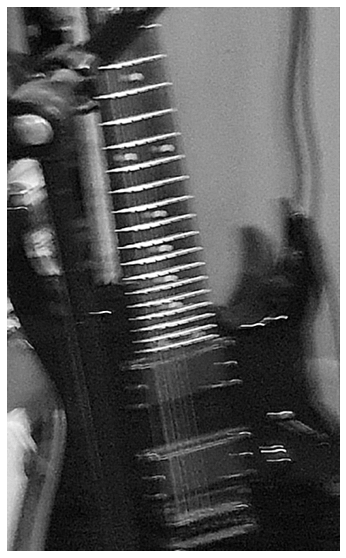

In [ ]:
show_img(c)

۳.۴

In [ ]:
edge_detection_filter_1 = 1/2 * np.array([[1, 0, -1]])

In [ ]:
a = cv2.filter2D(src=img, ddepth=-1, kernel=edge_detection_filter_1)

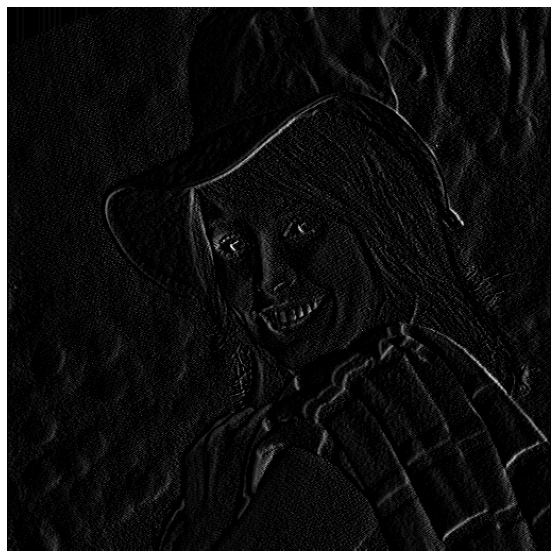

In [ ]:
show_img(a)

In [ ]:
edge_detection_filter_2 = 1/6 * np.array([[1, 0, -1], [1, 0, -1], [1, 0, -1]])

In [ ]:
b = cv2.filter2D(src=img, ddepth=-1, kernel=edge_detection_filter_2)

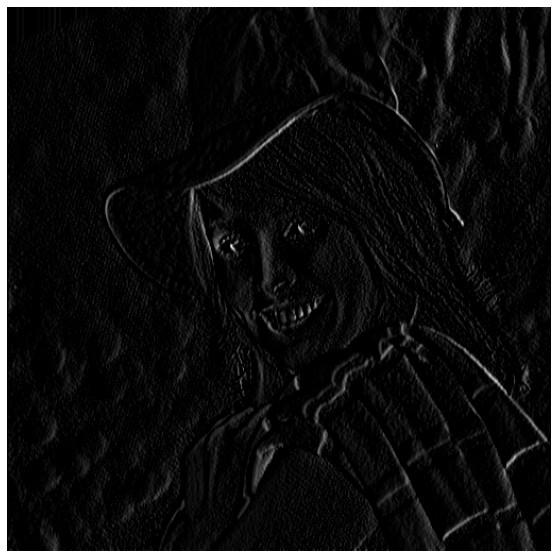

In [ ]:
show_img(b)

In [ ]:
edge_detection_filter_3 = 1/8 * np.array([[1, 0, -1], [2, 0, -2], [1, 0, -1]])

In [ ]:
c = cv2.filter2D(src=img, ddepth=-1, kernel=edge_detection_filter_3)

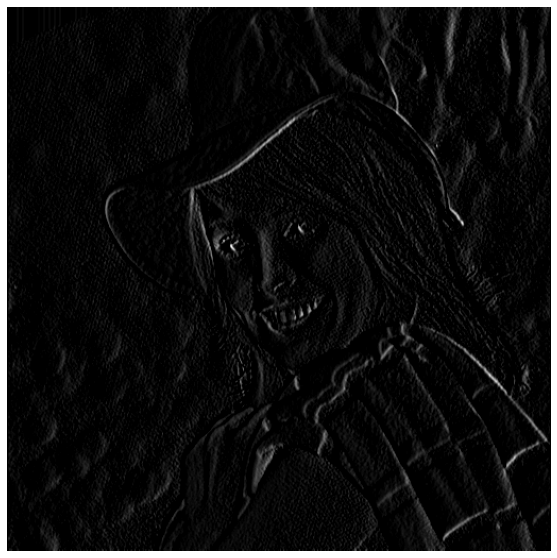

In [ ]:
show_img(c)

In [ ]:
robert1 = np.array([[1, 0], [0, -1]])

In [ ]:
r1 = cv2.filter2D(src=img, ddepth=-1, kernel=robert1)

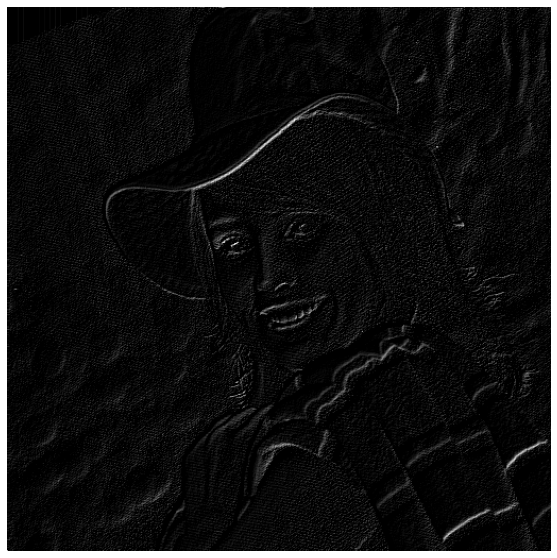

In [ ]:
show_img(r1)

In [ ]:
robert2 = np.array([[0, 1], [-1, 0]])

In [ ]:
r2 = cv2.filter2D(src=img, ddepth=-1, kernel=robert2)

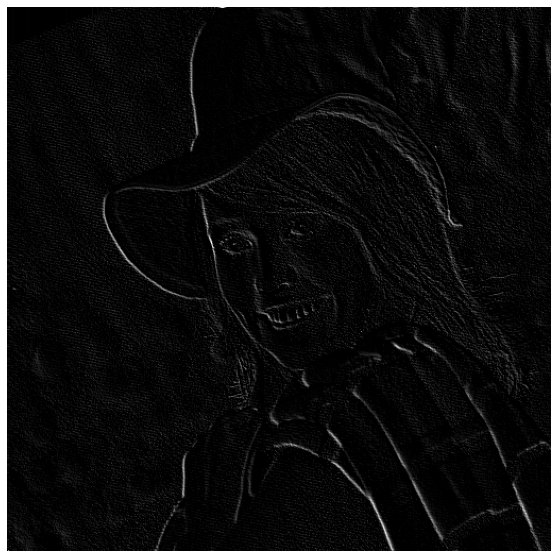

In [ ]:
show_img(r2)

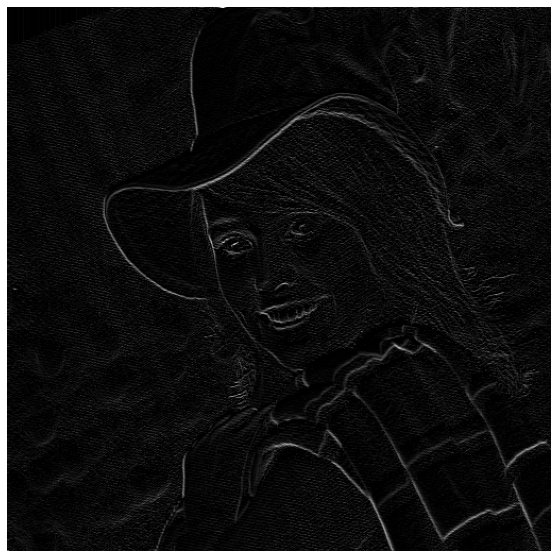

In [ ]:
show_img(r1 + r2)

3.5

In [ ]:
differences = []
for i in [3, 5, 7, 9, 11]:
    blur_image = cv2.GaussianBlur(img, (i, i), 10)
    a = blur_image - img
    differences.append(a)

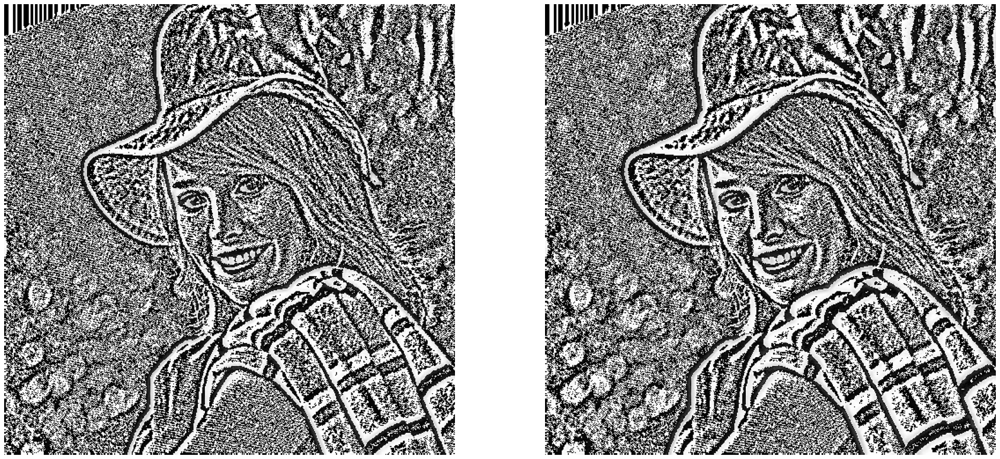

In [ ]:
show_img(differences[3], differences[4], figsize=30)

In [ ]:
alpha = 0.9
r = []
for i in differences:
    b = img + alpha * i
    r.append(b)

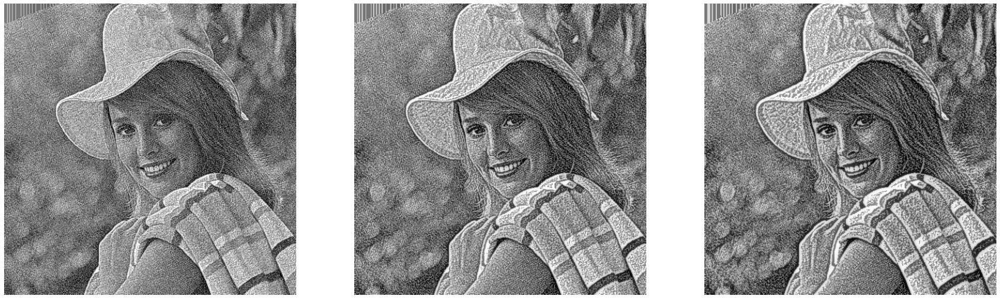

In [ ]:
show_img(r[0], r[1], r[2], figsize=30)

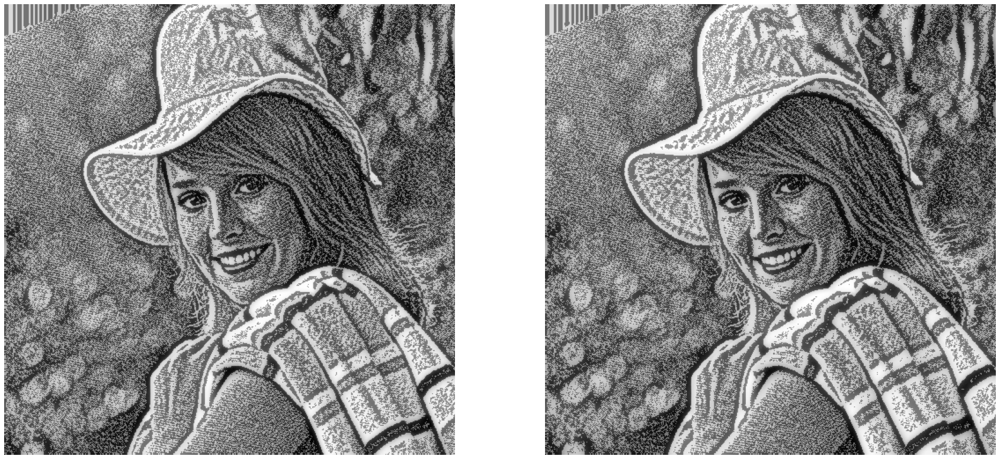